 <font size=4> Dados do Consumidor
<hr>

 Fonte: https://consumidor.gov.br/pages/dadosabertos/externo/

    
Descrição:
    <p style='font-size: 18px; line-height: 2; margin: 10px 50px; text-align: justify;'>Os dados que serão analisados aqui são dados abertos que foram coletados do sistema <b>Consumidor.gov.br</b> que é um canal para o registro de reclamações do consumidor sobre um produto ou serviço adquirido pelo cliente.</p>

# Importando Bibliotecas

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import folium
from folium.plugins import HeatMap
%matplotlib inline
plt.style.use("seaborn")

# Carregando Dados

In [2]:
df = pd.read_csv("data/1_semestre_2021.csv", sep=";", encoding='UTF-8')

# Entendendo os Dados

In [3]:
# Visualizando base de dados
df.head()

,Região,UF,Cidade,Sexo,Faixa Etária,Data Finalização,Tempo Resposta,Nome Fantasia,Segmento de Mercado,Área,Assunto,Grupo Problema,Problema,Como Comprou Contratou,Procurou Empresa,Respondida,Situação,Avaliação Reclamação,Nota do Consumidor
0,NE,MA,Codó,F,mais de 70 anos,01/01/2021,15,Facta Financeira,"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,Crédito Consignado / Cartão de Crédito Consign...,Contrato / Oferta,Cláusulas irregulares / abusivas / de interpre...,Não comprei / contratei,S,S,Finalizada não avaliada,Não Avaliada,NaN
1,S,RS,Viamão,F,entre 61 a 70 anos,01/01/2021,15,Itaú Unibanco Consignado,"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,Crédito Consignado / Cartão de Crédito Consign...,Contrato / Oferta,Não entrega do contrato ou documentação relaci...,Não comprei / contratei,S,S,Finalizada não avaliada,Não Avaliada,NaN
2,S,RS,Cachoeira do Sul,F,entre 41 a 50 anos,01/01/2021,15,Itaú Consignado,"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,Crédito Consignado / Cartão de Crédito Consign...,Cobrança / Contestação,Cobrança por serviço/produto não contratado / ...,Não comprei / contratei,N,S,Finalizada não avaliada,Não Avaliada,NaN
3,NE,MA,Codó,F,entre 61 a 70 anos,01/01/2021,15,Facta Financeira,"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,Crédito Consignado / Cartão de Crédito Consign...,Contrato / Oferta,Cláusulas irregulares / abusivas / de interpre...,Não comprei / contratei,S,S,Finalizada não avaliada,Não Avaliada,NaN
4,S,RS,Roca Sales,M,entre 61 a 70 anos,01/01/2021,15,Itaú Consignado,"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,Crédito Consignado / Cartão de Crédito Consign...,Cobrança / Contestação,Cobrança por serviço/produto não contratado / ...,Não comprei / contratei,S,S,Finalizada não avaliada,Não Avaliada,NaN


* <font color="indianred" size=4> Formato do conjunto de dados.

<font size=3 color=steelblue>  O atributo <font color="indianred" size=3>*.shape*  <font size=3 color=steelblue>dá uma dimensão geral dos dados. Ele retorna uma tupla (comprimento 2) que representa quantas linhas e colunas o conjunto de dados possui.

In [4]:
df.shape

(693956, 19)

<font size=3 color=steelblue> Podemos ver que a base de ados contém: 693.956 Mil linhas e 19 Colunas!

* <font color="indianred" size=4>Tipos de dados de todas as colunas no conjunto de dados.

<font size=3 color=steelblue> O <font color="indianred" size=3>*.info()* <font size=3 color=steelblue>exibe os tipos de dados das colunas como uma série do Panda.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 693956 entries, 0 to 693955
Data columns (total 19 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Região                  693956 non-null  object 
 1   UF                      693956 non-null  object 
 2   Cidade                  693956 non-null  object 
 3   Sexo                    693956 non-null  object 
 4   Faixa Etária            693956 non-null  object 
 5   Data Finalização        693956 non-null  object 
 6   Tempo Resposta          693956 non-null  int64  
 7   Nome Fantasia           693956 non-null  object 
 8   Segmento de Mercado     693956 non-null  object 
 9   Área                    693956 non-null  object 
 10  Assunto                 693956 non-null  object 
 11  Grupo Problema          693956 non-null  object 
 12  Problema                693956 non-null  object 
 13  Como Comprou Contratou  693956 non-null  object 
 14  Procurou Empresa    

* <font color="indianred" size=4>Estatísticas resumidas da colunas numéricas.

In [6]:
df.describe()

,Tempo Resposta,Nota do Consumidor
count,693956.000000,351704.000000
mean,7.703526,2.946975
std,4.731054,1.773138
min,0.000000,1.000000
25%,4.000000,1.000000
50%,8.000000,3.000000
75%,12.000000,5.000000
max,17.000000,5.000000


<font size=3 color=steelblue> Podemos ver para cada característica numérica, a contagem, o valor médio, desvio padrão, valor mínimo, valor máximo e o percentil 25%, o percentil 50% ou mediana, o percentil 75%.

* <font color="indianred" size=4>Verificando se há valores ausentes significativos na base de dados.

In [7]:
print('Quantidade de dados nulos:', df.isna().sum().sum())

Quantidade de dados nulos: 342252


## Verificando quais os dados nulos

In [8]:
df.isna().sum()

Região                         0
UF                             0
Cidade                         0
Sexo                           0
Faixa Etária                   0
Data Finalização               0
Tempo Resposta                 0
Nome Fantasia                  0
Segmento de Mercado            0
Área                           0
Assunto                        0
Grupo Problema                 0
Problema                       0
Como Comprou Contratou         0
Procurou Empresa               0
Respondida                     0
Situação                       0
Avaliação Reclamação           0
Nota do Consumidor        342252
dtype: int64

In [9]:
df['Nota do Consumidor'].unique()

array([nan,  1.,  4.,  5.,  3.,  2.])

## Decisão sobre os dados Ausentes.

* Como vemos acima a base dados contém dados nulos, que se tratam de notas que não foram dadas pelos consumidores.
* Diante disso irei manter esses dados na base, pois se tratam de uma quantidade muito altar para ser descartada e sua permanência não irá afetar as analises futuras.

# Iniciando Analises

## Número de reclamações por Estado

In [10]:
reclamacoes_por_estado = df.groupby('UF')['UF'].count()\
                                               .sort_values(ascending=False)\
                                               .to_frame(name="QUANTIDADE")\
                                               .reset_index()
reclamacoes_por_estado.head()

,UF,QUANTIDADE
0,SP,171797
1,MG,74716
2,RJ,62064
3,PR,60687
4,RS,43551


In [11]:
percentual_sp = df.value_counts('UF', normalize=True).round(2)['SP']*100 ;percentual_sp

25.0

### Visualizando Gráfico

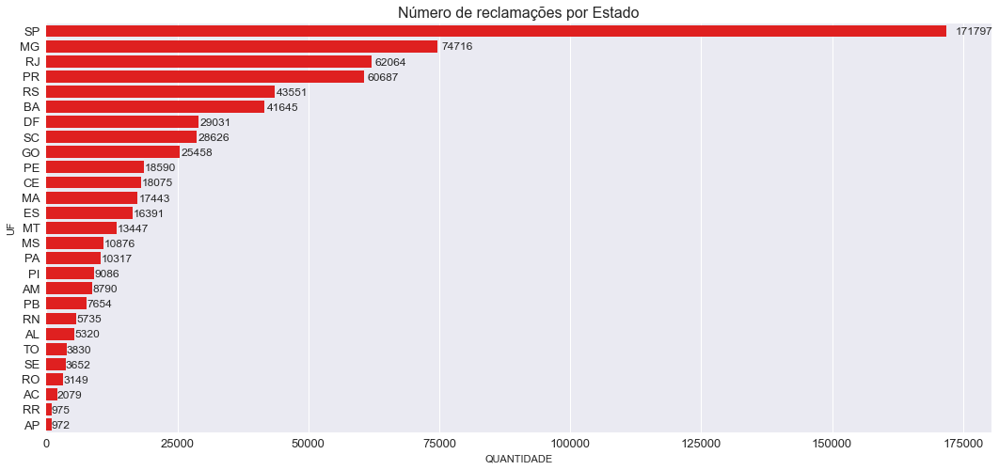

In [12]:
# setando tamanho do gráfico
plt.subplots(figsize=(18, 8))
# atribuindo dados ao gráfico
ax = sns.barplot(data=reclamacoes_por_estado,
            x='QUANTIDADE', 
            y='UF',
            color="red")
# setando titulo do gráfico
ax = plt.title("Número de reclamações por Estado" , fontsize=16)
ax = plt.yticks(size=13)
ax = plt.xticks(size=13)

# definindo variáveis de anotações do gráfico
n = range(reclamacoes_por_estado.UF.shape[0])
s = reclamacoes_por_estado.QUANTIDADE.values
# criando função para a visualização dos valores na barra
for i in range(len(s)):
    plt.annotate(s[i],
                 xy=(s[i]*1.01, n[i]), fontsize=12,
                 ha='left', 
                 va="center_baseline")
    
plt.savefig('imagens_graficos/grafico_reclamacoes_por_estado.png', )

* <font size=4 color=steelblue> **Nessa vizualização podemos verificar que o maior numero de reclamações se concentram na cidade de São paulo, que representa um <font size=4 color=indianRed>total de 25% de todas as reclamações feitas<font size=4 color=steelblue> no primeiro semestre de 2021, tendo uma diferença de mais que o dobro do segundo estado com mais reclamações que é MG que representa <font size=4 color=indianRed> apenas 10% das reclamações.**

## Quantidade de reclamações por sexo.

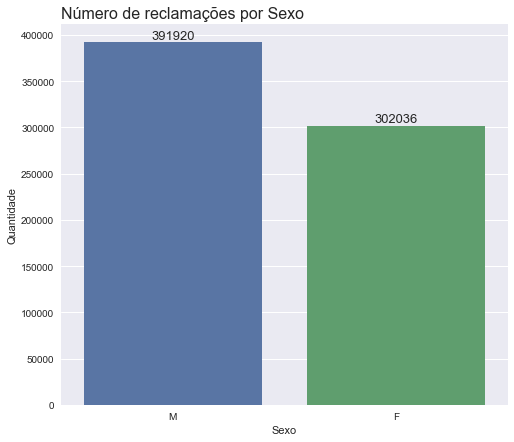

In [13]:
# agrupando dados por sexo
reclamacoes_por_sexo = df.groupby('Sexo')['Sexo'].count()\
                                                 .sort_values(ascending=False)\
                                                 .to_frame(name="Quantidade")\
                                                 .reset_index()

# setando tamanho do gráfico
plt.subplots(figsize=(8, 7))
# Atribuindo dados ao gráfico
ax = sns.barplot(data=reclamacoes_por_sexo, y='Quantidade',x='Sexo')
# setando titulo do gráfico
ax = plt.title("Número de reclamações por Sexo" , fontsize=16, loc="left")

# definindo variáveis de anotações do gráfico
n = range(reclamacoes_por_sexo.Sexo.shape[0])
s = reclamacoes_por_sexo.Quantidade.values
# criando função para a visualização dos valores na barra
for i in range(len(s)):
    plt.annotate(s[i],
                 xy=(n[i], s[i]), 
                 fontsize=13,
                 ha='center', 
                 va='bottom')
    
plt.savefig('imagens_graficos/grafico_reclamacoes_por_sexo.png')

* <font size=4 color=steelblue>**Podemos ver que a diferença de reclamações por sexo não é tão grande.**

## Reclamações por segmento de Mercado - TOP 20

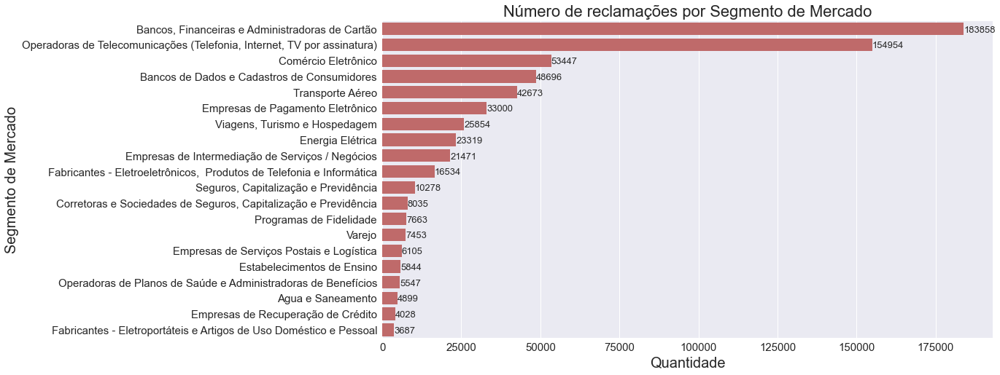

In [14]:
Reclamacoes_por_segmento = df.groupby('Segmento de Mercado')['Segmento de Mercado'].count()\
                                                                                   .sort_values(ascending=False)\
                                                                                   .to_frame(name="Quantidade")\
                                                                                   .reset_index()[:20]



# setando tamanho do gráfico
plt.subplots(figsize=(15,8))
# atribuindo dados ao gráfico
sns.barplot(data=Reclamacoes_por_segmento,
            x='Quantidade', 
            y='Segmento de Mercado',
            color="indianred")
# setando titulo do gráfico
ax = plt.title("Número de reclamações por Segmento de Mercado" , fontsize=22)
ax = plt.ylabel('Segmento de Mercado', fontsize=20)
ax = plt.xlabel('Quantidade', fontsize=20)
ax = plt.yticks(size=15)
ax = plt.xticks(size=15)

# definindo variáveis de anotações do gráfico
n = range(Reclamacoes_por_segmento['Segmento de Mercado'].shape[0])
s = Reclamacoes_por_segmento.Quantidade.values

# criando função para a visualização dos valores na barra
for i in range(len(s)):
    plt.annotate(s[i],
                 xy=(s[i], n[i]), fontsize=13,
                 ha='left', 
                 va="center_baseline")
    
    
plt.savefig('imagens_graficos/Reclamacoes_por_segmento.png', bbox_inches='tight', dpi=100)

* <font size=4 color=steelblue >**Acima podemos perceber que as empresas de <font size=4 color=indianred> bancos, Financeiras e Administradoras de Cartões <font size=4 color=steelblue >junto com as <font size=4 color=indianred>Operadoras de Telecomunicações<font size=4 color=steelblue> lideram disparado as reclamações no primeiro semestre de 2021.**

## Faixa etária de consumidores que mais fazem reclamações

In [15]:
#Agrupando dados por faixa etária
reclamacoes_por_faixa_etaria = df.groupby('Faixa Etária')['Faixa Etária'].count()\
                                                                        .sort_values(ascending=False)\
                                                                        .to_frame(name="Quantidade")\
                                                                        .reset_index()
#Visualizando os dados
reclamacoes_por_faixa_etaria

,Faixa Etária,Quantidade
0,entre 31 a 40 anos,223129
1,entre 21 a 30 anos,175345
2,entre 41 a 50 anos,117665
3,entre 51 a 60 anos,76230
4,entre 61 a 70 anos,62667
5,mais de 70 anos,26591
6,até 20 anos,12329


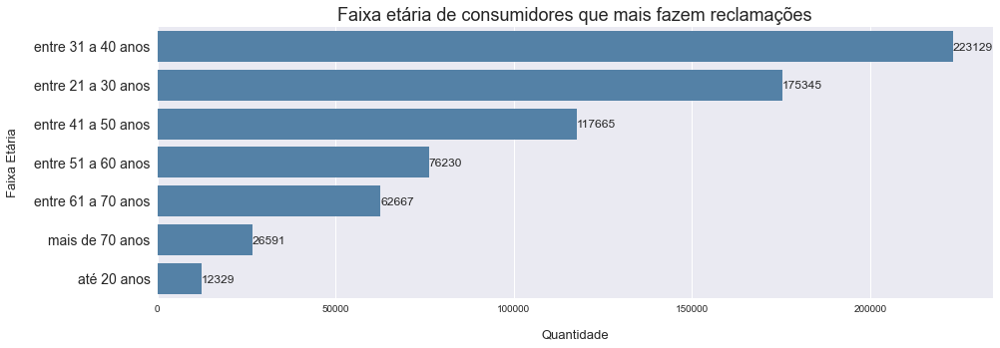

In [16]:
# setando tamanho do gráfico
plt.subplots(figsize=(15,5))
# atribuindo dados ao gráfico
sns.barplot(data=reclamacoes_por_faixa_etaria,
            x='Quantidade', 
            y='Faixa Etária',
            color='steelblue')
# setando titulo do gráfico
ax = plt.title("Faixa etária de consumidores que mais fazem reclamações" , fontsize=18)
ax = plt.ylabel('Faixa Etária', fontsize=13, labelpad=15)
ax = plt.xlabel('Quantidade', fontsize=13, labelpad=15)
ax = plt.yticks(size=14)
# definindo variáveis de anotações do gráfico
n = range(reclamacoes_por_faixa_etaria.shape[0])
s = reclamacoes_por_faixa_etaria.Quantidade.values
# criando função para a visualização dos valores na barra
for i in range(len(s)):
    plt.annotate(s[i],
                 xy=(s[i], n[i]), fontsize=12,
                 ha='left', 
                 va="center_baseline")
        
plt.savefig('imagens_graficos/reclamacoes_por_faixa_etaria.png', bbox_inches='tight', dpi=300)

* <font size=4 color=steelblue>**Podemos ver que a faixa etária com mais reclamações fica <font color=indianred>entre 31 a 40 anos <font color=steelblue>com o total de <font color=indianred>223.139 mil <font color=steelblue> reclamações.** 

## Qual Faixa Etária costuma contratar mais serviços pela Internet?

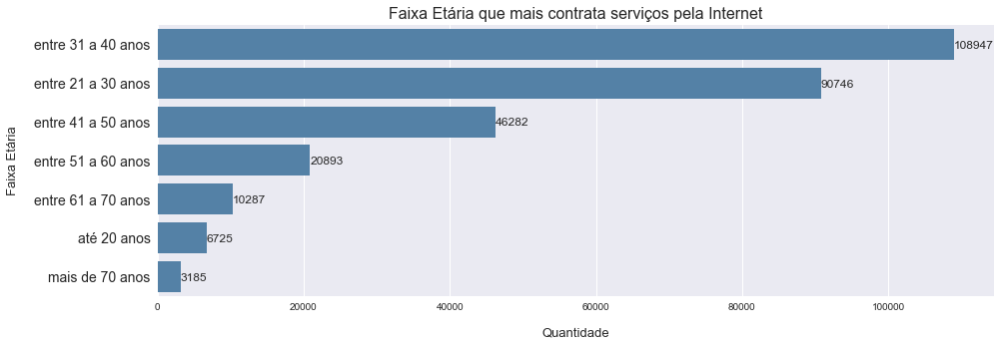

In [17]:
#Criando filtro apenas por contratações feitas pela internet e agrupando os dados por faixa etária
contratacoes_por_internet = df[df["Como Comprou Contratou"] == "Internet"].groupby('Faixa Etária')['Faixa Etária']\
                                                                          .count()\
                                                                          .sort_values(ascending=False)
                                                   
# setando tamanho do gráfico
plt.subplots(figsize=(15,5))
# Definindo formatações do gráfico
sns.barplot(y=contratacoes_por_internet.index, x=contratacoes_por_internet.values, color='steelblue')
ax = plt.title("Faixa Etária que mais contrata serviços pela Internet" , fontsize=16) #titulo
ax = plt.ylabel('Faixa Etária', fontsize=13, labelpad=15) #Titulo eixo Y
ax = plt.xlabel('Quantidade', fontsize=13, labelpad=15) #Titulo eixo X
ax = plt.yticks(size=14) #Formatação eixo Y

# definindo variáveis de anotações do gráfico
n = range(contratacoes_por_internet.shape[0])
s = contratacoes_por_internet.values
# criando função para a visualização dos valores na barra
for i in range(len(s)):
    plt.annotate(s[i],
                 xy=(s[i], n[i]), fontsize=12,
                 ha='left', 
                 va="center_baseline")

plt.savefig('imagens_graficos/Etária costuma contratar mais serviços pela Internet.png', bbox_inches='tight', dpi=300)

* <font size=4 color=steelblue> **Diante dessa amostragem podemos perceber que quanto mais jovens, mais tendem a contratar os serviços pela Internet.**

## Qual grupo tende a ter mais reclamações?

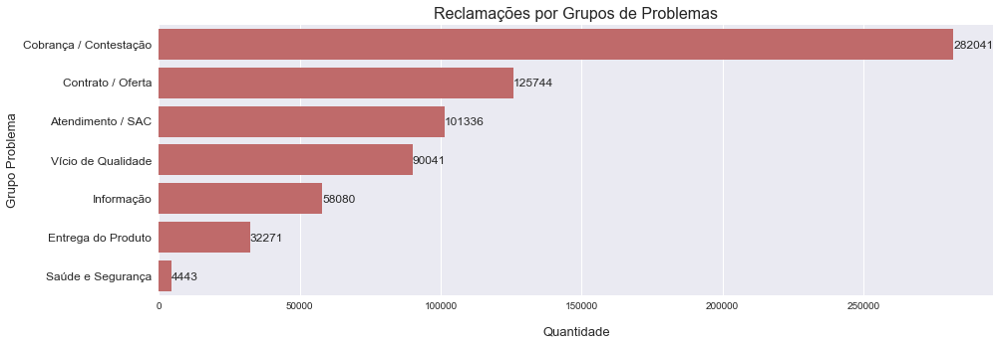

In [18]:
grupo_problemas = df['Grupo Problema'].value_counts().sort_values(ascending=False)
# setando tamanho do gráfico
plt.subplots(figsize=(15,5))
# Definindo formatações do gráfico
sns.barplot(y=grupo_problemas.index, x=grupo_problemas.values, color='indianred')
ax = plt.title("Reclamações por Grupos de Problemas" , fontsize=16) #titulo
ax = plt.ylabel('Grupo Problema', fontsize=13) #Titulo eixo Y
ax = plt.xlabel('Quantidade', fontsize=13, labelpad=15) #Titulo eixo X
ax = plt.yticks(size=12) #Formatação eixo Y

# definindo variáveis de anotações do gráfico
n = range(grupo_problemas.shape[0])
s = grupo_problemas.values
# criando função para a visualização dos valores na barra
for i in range(len(s)):
    plt.annotate(s[i],
                 xy=(s[i], n[i]), fontsize=12,
                 ha='left', 
                 va="center_baseline")

plt.savefig('imagens_graficos/grupo_problemas.png', bbox_inches='tight', dpi=300)

* <font size=4 color=steelblue> **Dentre todas as reclamações feitas o quesito <font size=4 color=indianred>Cobranças e contestações <font size=4 color=steelblue> lideram disparadas as reclamações feitas no primeiro semestre de 2021.**

# Avaliando as notas dos consumidores

In [19]:
df['Nota do Consumidor'].value_counts()

1.0    141063
5.0    121872
4.0     37371
3.0     33760
2.0     17638
Name: Nota do Consumidor, dtype: int64

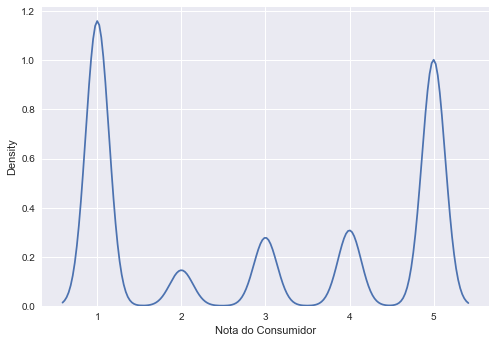

In [20]:
ax = sns.kdeplot(data=df, x="Nota do Consumidor")
plt.savefig('imagens_graficos/Nota do Consumidor.png', bbox_inches='tight', dpi=300)

* <font size=4 color=steelblue> **No gráfico acima podemos perceber que temos dois extremos, com uma concentração de notas em <font size=4 color=indianred>1 e 5<font size=4 color=steelblue>, que nos leva a presumir que, ou o cliente gostou muito do atendimento ou ele odiou e colocou a menor nota disponível**

# Tempo que a empresa leva para responder o cliente.

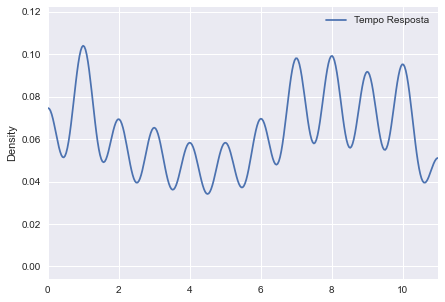

In [21]:
ax = df.plot.density(y='Tempo Resposta',xlim=[0,11], figsize=(7,5))
plt.savefig('imagens_graficos/Tempo Resposta.png', bbox_inches='tight', dpi=300)

<font size=4 color=steelblue>**Podemos ver que em média as empresas levam de<font size=4 color=indianred > 6 a 10 dias <font size=4 color=steelblue >para atender as solicitações dos seus consumidores.**

# Reclamações registradas e não resolvidas por segmento de mercado

In [22]:
#Contando valores
x = df.groupby('Segmento de Mercado')['Segmento de Mercado'].count()
#Filtrando os segmentos de mercado com mais de 1000 reclamações
x = x[x > 1000]
#Aplicando filtro no df principal
df1 = df[df['Segmento de Mercado'].isin(x.keys())]
#filtando reclamções não resolvidas
registradas_e_nao_resolvidas = df1[df1['Avaliação Reclamação']=='Não Resolvida']
#Agrupando novamente os dados 
x1 = registradas_e_nao_resolvidas.groupby('Segmento de Mercado')['Segmento de Mercado'].count()

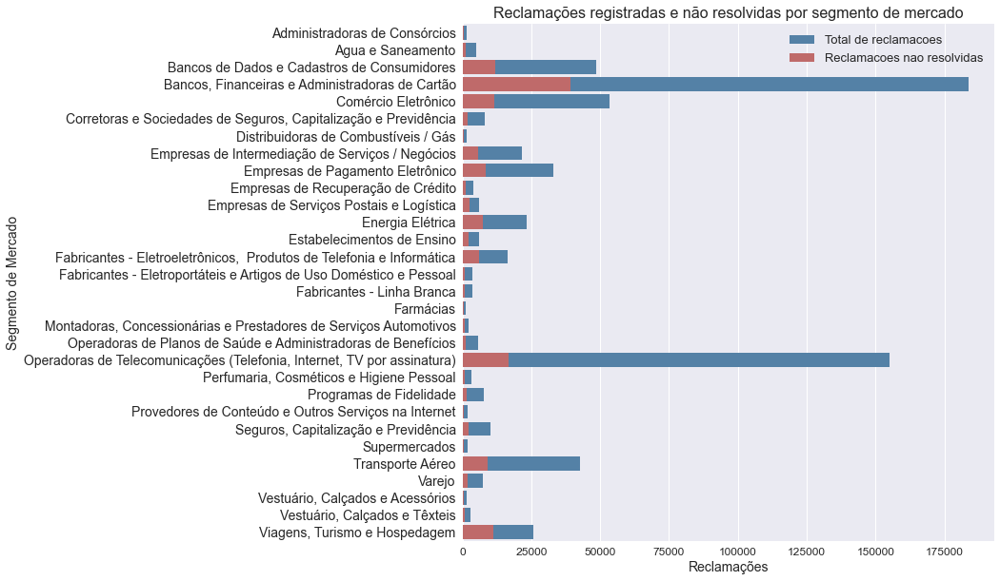

In [23]:
#Setando tamanho do gráfico
plt.subplots(figsize=(10, 10))
#setando gráfico
sns.barplot(x=x.values, y=x.keys(), label="Total de reclamacoes", color='steelblue')
sns.barplot(x=x1.values, y=x1.keys(), label="Reclamacoes nao resolvidas", color='indianred')
# Configurações de titulos do gráfico
plt.title("Reclamações registradas e não resolvidas por segmento de mercado" , fontsize=16) #titulo do grafico
plt.ylabel('Segmento de Mercado', fontsize=14) #Titulo eixo Y
plt.xlabel('Reclamações', fontsize=14) #Titulo eixo Y
plt.yticks(size=14) #Formatação eixo Y
plt.xticks(size=12) #Formatação eixo X
plt.legend(ncol=1, loc="best", fontsize=13) #configurações da legenda
plt.savefig('imagens_graficos/Reclamações registradas e não resolvidas por segmento de mercado.png', bbox_inches='tight')
plt.show()

* <font size=4 color=steelblue>**Como podemos ver no gráfico a quantidade de reclamações não resolvidas e pequena comparado ao total para cada segmento.**
  * <font size=4 color=steelblue>**Mas se olharmos com atenção ao segmento de <font size=4 color=indianred>viagens, turismo e hospedagem. <font size=4 color=steelblue>Podemos ver que <font size=4 color=indianred>quase 50% das reclamações registradas não foram resolvidas<font size=4 color=steelblue>, que podem ser por conta da pandemia que estamos vivendo, e como já sabemos o segmento mais afetado foi exatamente esse.**

# Analisando Reclamações por região

* <font color="indianred" size=4> Importando base de dados com os municipios

In [24]:
municipios = pd.read_csv("data/municipios.csv", sep=";", encoding='latin1', usecols=['Município', 'UF', 'LATITUDE', 'LONGITUDE'] )

In [25]:
municipios.head()

,LATITUDE,LONGITUDE,UF,Município
0,-11.92,-61.99,RO,Alta Floresta D´oeste
1,-9.91,-63.04,RO,Ariquemes
2,-13.49,-60.54,RO,Cabixi
3,-11.43,-61.44,RO,Cacoal
4,-13.18,-60.81,RO,Cerejeiras


* <font size=4 color=steelblue> **Essa base de dados pode ser encontrada no site do IBGE, e nela contem todos os municipios do Brasil contendo sua latitude e longitude, que são so dados que irei usar para a plotagem do mapa.**

* <font color="indianred" size=4> Unindo as duas base de dados

In [26]:
df1 =  pd.merge(df, municipios, 
                left_on=['UF', 'Cidade'], 
                right_on=['UF', 'Município'], 
                how='left')

In [27]:
df1.head()

,Região,UF,Cidade,Sexo,Faixa Etária,Data Finalização,Tempo Resposta,Nome Fantasia,Segmento de Mercado,Área,...,Problema,Como Comprou Contratou,Procurou Empresa,Respondida,Situação,Avaliação Reclamação,Nota do Consumidor,LATITUDE,LONGITUDE,Município
0,NE,MA,Codó,F,mais de 70 anos,01/01/2021,15,Facta Financeira,"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,...,Cláusulas irregulares / abusivas / de interpre...,Não comprei / contratei,S,S,Finalizada não avaliada,Não Avaliada,NaN,-4.45,-43.88,Codó
1,S,RS,Viamão,F,entre 61 a 70 anos,01/01/2021,15,Itaú Unibanco Consignado,"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,...,Não entrega do contrato ou documentação relaci...,Não comprei / contratei,S,S,Finalizada não avaliada,Não Avaliada,NaN,-30.08,-51.02,Viamão
2,S,RS,Cachoeira do Sul,F,entre 41 a 50 anos,01/01/2021,15,Itaú Consignado,"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,...,Cobrança por serviço/produto não contratado / ...,Não comprei / contratei,N,S,Finalizada não avaliada,Não Avaliada,NaN,-30.03,-52.89,Cachoeira do Sul
3,NE,MA,Codó,F,entre 61 a 70 anos,01/01/2021,15,Facta Financeira,"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,...,Cláusulas irregulares / abusivas / de interpre...,Não comprei / contratei,S,S,Finalizada não avaliada,Não Avaliada,NaN,-4.45,-43.88,Codó
4,S,RS,Roca Sales,M,entre 61 a 70 anos,01/01/2021,15,Itaú Consignado,"Bancos, Financeiras e Administradoras de Cartão",Serviços Financeiros,...,Cobrança por serviço/produto não contratado / ...,Não comprei / contratei,S,S,Finalizada não avaliada,Não Avaliada,NaN,-29.28,-51.86,Roca Sales


In [28]:
reclamacoes = df1[['LATITUDE', 'LONGITUDE']].dropna().values.tolist()

In [29]:
mapa = folium.Map(location=[-11.736408556893183, -50.10856051986131], 
                  zoom_start=5, 
                  tiles='cartodb positron')


#criando mapa de calor
HeatMap(reclamacoes, name='Reclamações').add_to(mapa)

#adicionando controles do mapa
folium.LayerControl().add_to(mapa)

#Salvando mapa
mapa.save("HeatMapa_reclamcoes.html")

#visualizando
mapa
